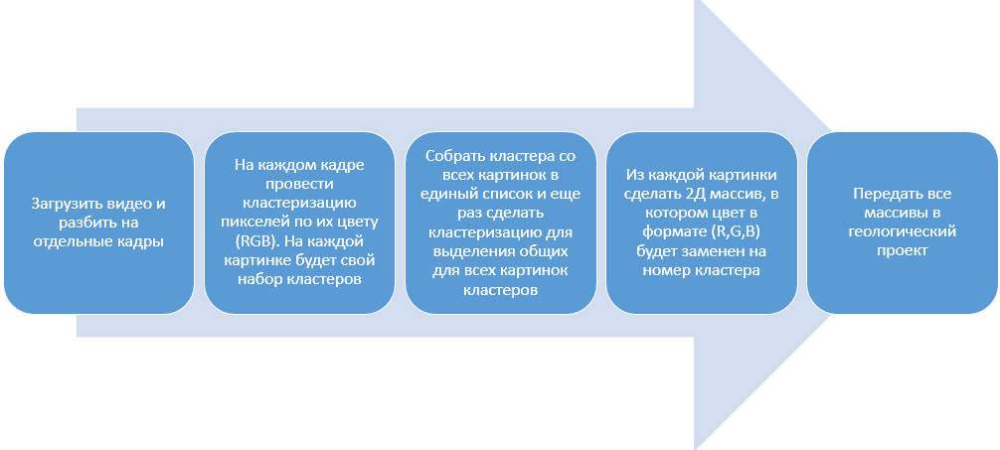

In [2]:
from moviepy.editor import *
import matplotlib.pyplot as plt
import numpy as np
import cv2
from sklearn.cluster import MeanShift, estimate_bandwidth
from tqdm import tqdm


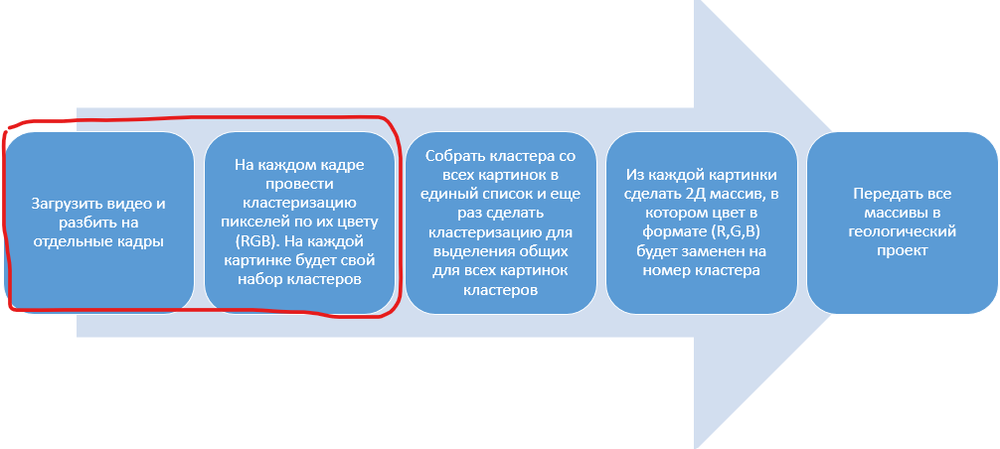

In [3]:
charade = VideoFileClip("Watch_An_Oxbow_Lake_Form__Ucayali_River__1985_-_2013.mp4")

In [4]:
centroids = np.empty((0,3), int) # empty list for future colour centroids in (R,G,B) format
frame_list = []                  # empty list for frames
image_list = []                  # empty list for processed frames
for i in tqdm(range(33,61)):
    tfreeze = cvsecs(i) # Time of the freeze
    im_freeze1 = charade.get_frame(tfreeze)
    im_freeze = im_freeze1[20:700,:,:]
    frame_list.append(im_freeze)
      
    img = cv2.cvtColor(im_freeze,cv2.COLOR_BGR2RGB)
    twoDimage = img.reshape((-1,3))
    twoDimage = np.float32(twoDimage)
    
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    K = 5
    attempts=10
    
    ret,label,center=cv2.kmeans(twoDimage,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
    center = np.uint8(center)
    res = center[label.flatten()]
    result_image = res.reshape((img.shape))
    
    # Clusters in each image would be slightly different 
    # and their centroids would also be slightly different. 
    # We will save every centroid from each image
    centroids = np.append(centroids, center, axis=0)
    image_list.append(result_image)
print('{} images were obtained'.format(i))

100%|██████████████████████████████████████████████████████████████████████████████████| 28/28 [00:35<00:00,  1.27s/it]

60 images were obtained


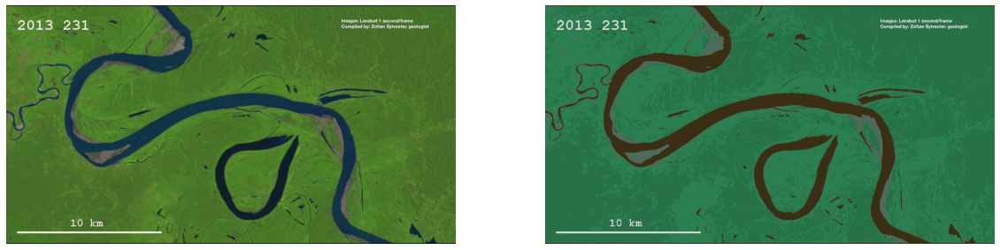

In [5]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
plt.subplot(1, 2, 1)
plt.imshow(frame_list[-1])
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(image_list[-1])
plt.axis('off')
plt.show()

In [6]:
image_list[-1].shape

(680, 1280, 3)

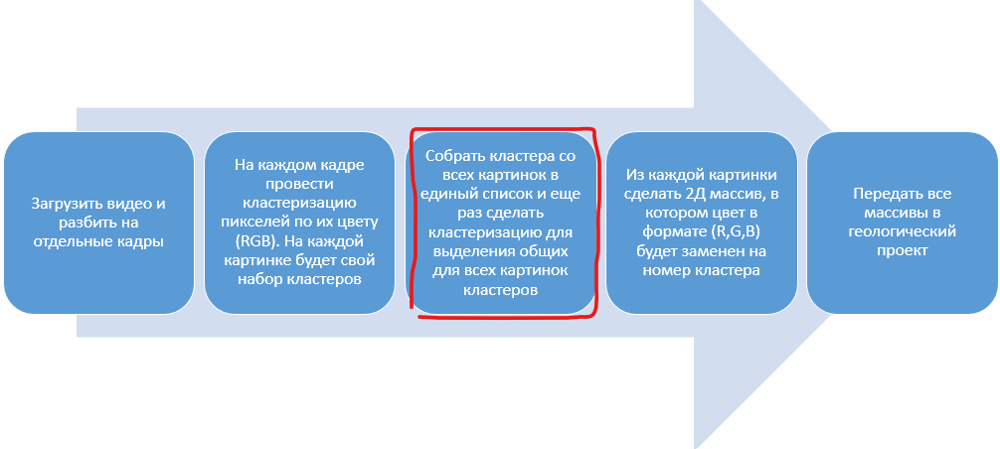

[61 47 22]


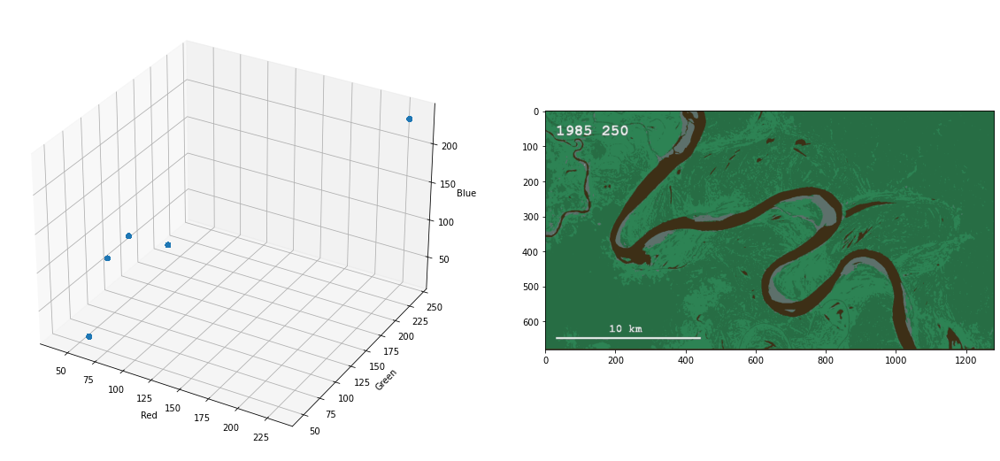

In [7]:
img = image_list[0]

print(img[0,0,:])

fig = plt.figure()
fig.set_figheight(10)
fig.set_figwidth(20)
axis1 = fig.add_subplot(1, 2, 1, projection="3d")
axis1.scatter(img[:,:,0], img[:,:,1], img[:,:,2], marker=".", s=100)
axis1.set_xlabel("Red")
axis1.set_ylabel("Green")
axis1.set_zlabel("Blue")

axis2 = fig.add_subplot(1, 2, 2)
axis2.imshow(img)

plt.show()

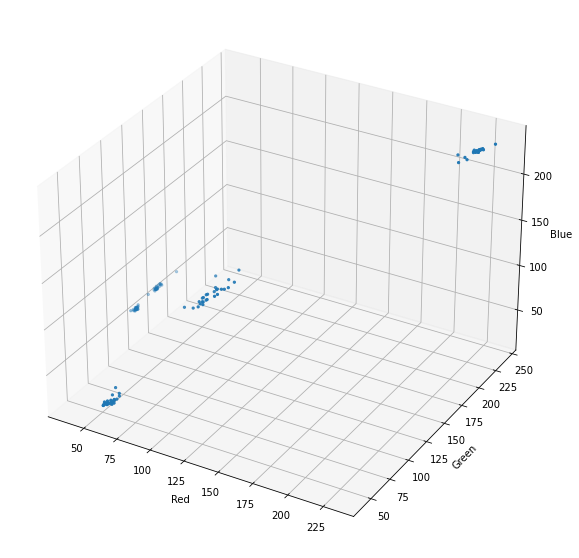

In [13]:
fig = plt.figure()
fig.set_figheight(10)
fig.set_figwidth(20)
axis1 = fig.add_subplot(1, 1, 1, projection="3d")
axis1.scatter(centroids[:,0], centroids[:,1], centroids[:,2], marker=".")
axis1.set_xlabel("Red")
axis1.set_ylabel("Green")
axis1.set_zlabel("Blue")

plt.show()

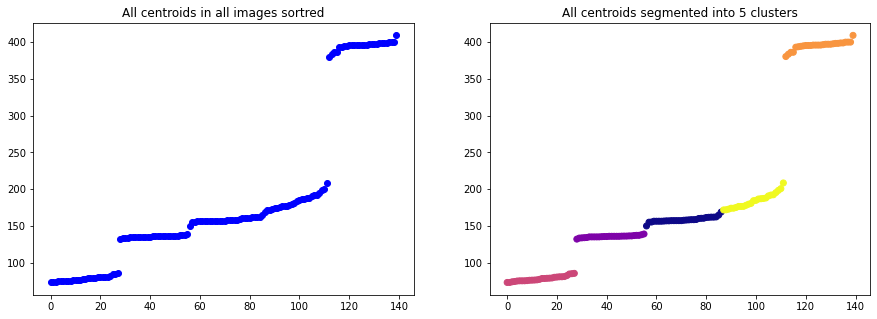

In [8]:
# Analyze all centroids and find average edges of each cluster

# dist(R,G,B) = sqrt(R^2+G^2+B^2)
dist = [np.linalg.norm(a - 0) for a in centroids] # Calculated norm of each pixel in RGB space
x = np.array(dist)
y = np.zeros(len(x))
             
X = np.column_stack([x,y])
             
bandwidth = estimate_bandwidth(X, quantile=0.2)
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(X)
labels = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)

X[:,1] = labels
X = X[X[:, 0].argsort()]

fig, ax = plt.subplots(1, 2, figsize=(15,5))
plt.subplot(1, 2, 1)
plt.title("All centroids in all images sortred")
plt.plot(np.sort(dist),'bo')
plt.subplot(1, 2, 2)
plt.title('All centroids segmented into {} clusters'.format(n_clusters_))
plt.scatter(np.arange(140), X[:,0], c=X[:,1], cmap='plasma')
plt.show()

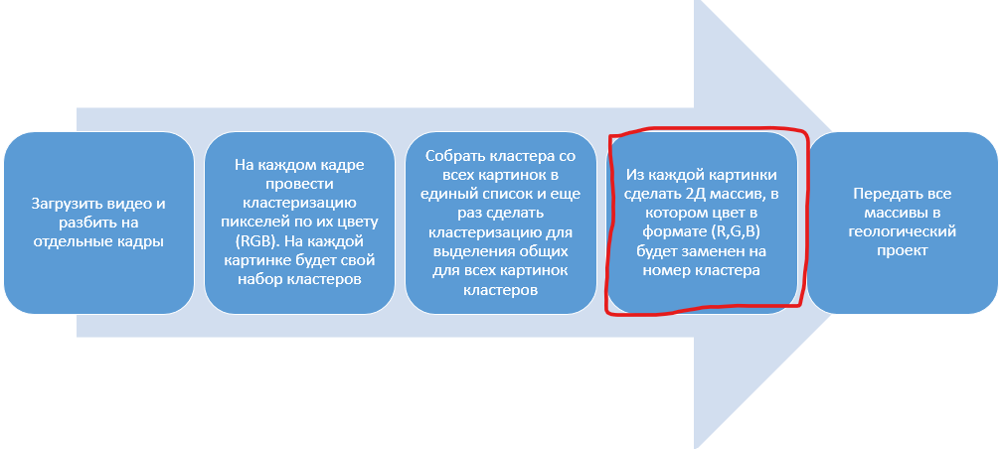

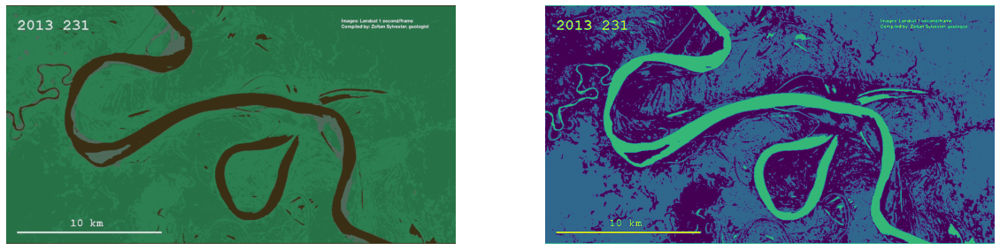

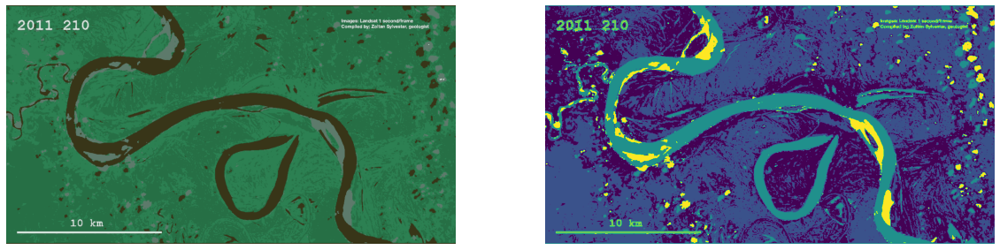

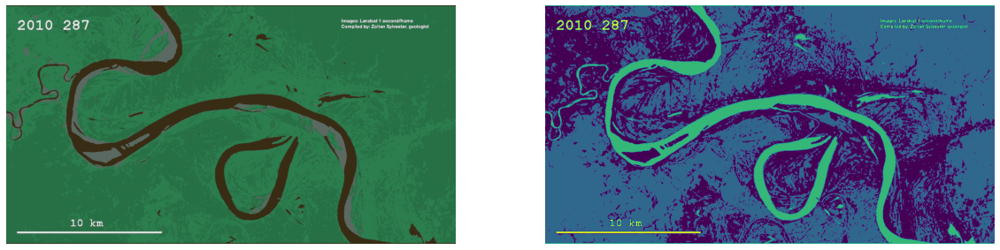

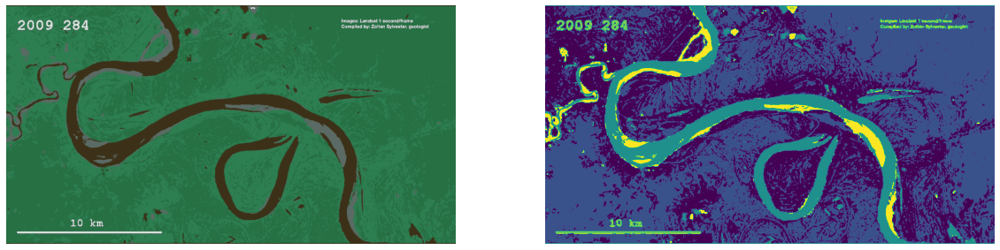

...

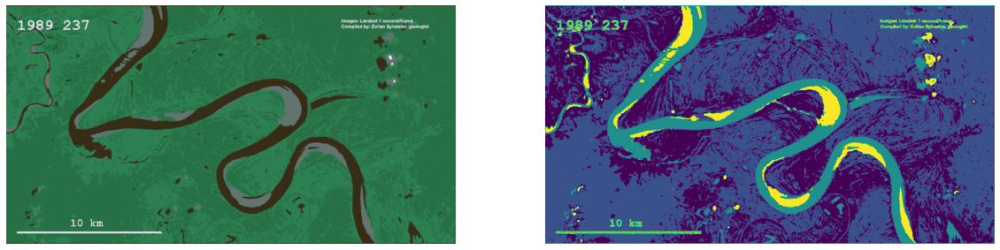

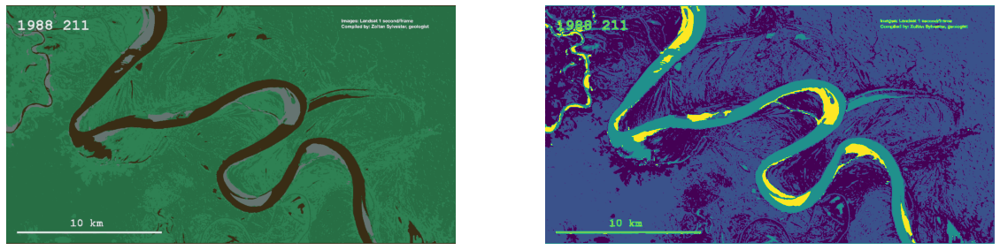

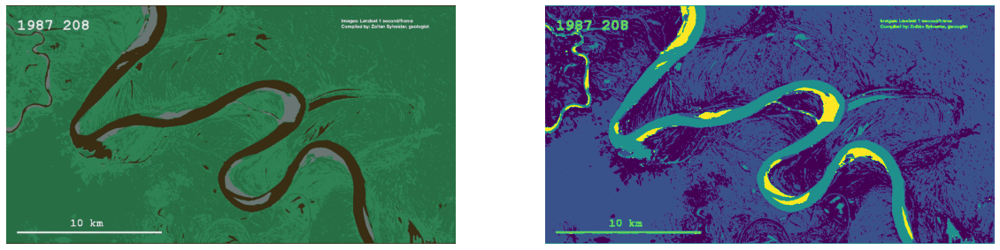

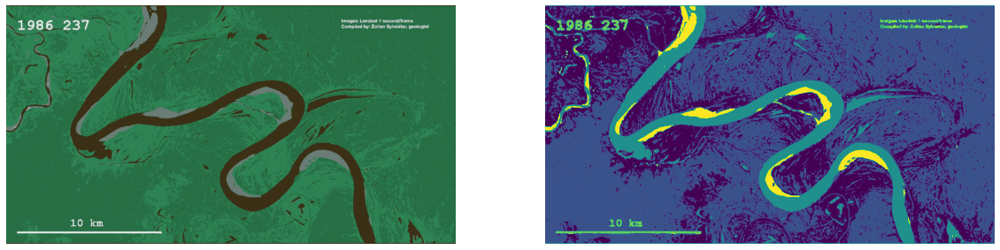

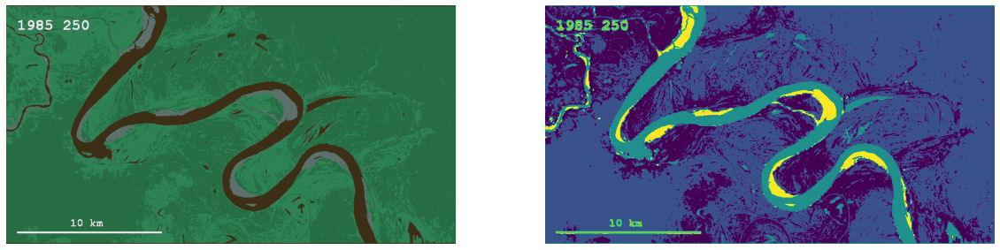

In [14]:
result_image_list = []
for img in reversed(image_list):
    dist_arr = np.linalg.norm(img.reshape(-1,3) - 0, axis=1)
    temp = ms.predict(np.column_stack([dist_arr,np.zeros(len(dist_arr))]))
    temp = temp.reshape(img.shape[0], img.shape[1])
    #np.savetxt('dist.txt', res_pic, fmt='%i')
    fig, ax = plt.subplots(1, 2, figsize=(20,10))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(temp)
    plt.axis('off')
    plt.show()
    result_image_list.append(temp)    

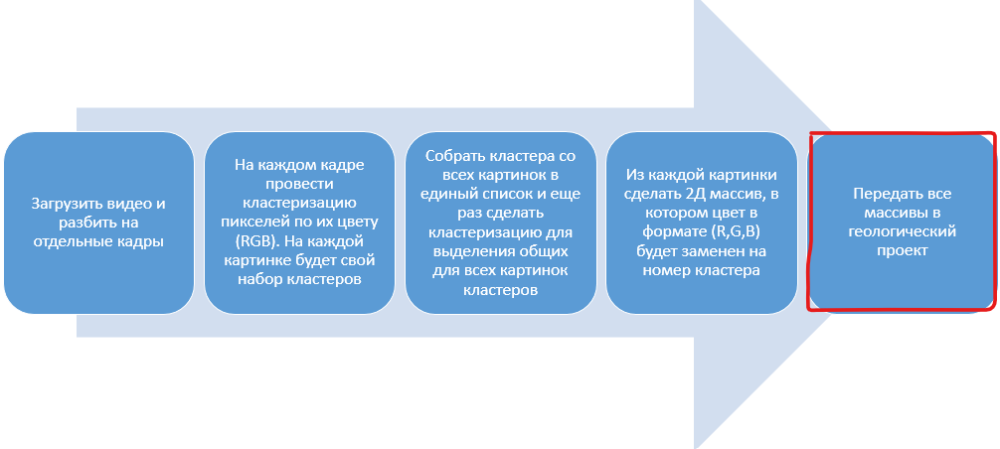

In [15]:
with open("test_1.grdecl", "wb") as f:
    f.write(b"river\n")
    for i in range(len(result_image_list)):
        arr=result_image_list[i].reshape(43520,20)
        np.savetxt(f, arr, fmt='%i')
        f.write(b"\n")
        
    f.write(b"/")